### The dataset contains the following columns related to car sales:

1. **car_name**: Name of the car.
2. **brand**: Brand of the car.
3. **model**: Model name.
4. **vehicle_age**: Age of the vehicle in years.
5. **km_driven**: Total kilometers the car has been driven.
6. **seller_type**: Type of seller (e.g., Individual, Dealer).
7. **fuel_type**: Type of fuel used (e.g., Petrol, Diesel).
8. **transmission_type**: Transmission type (e.g., Manual, Automatic).
9. **mileage**: Mileage in kilometers per liter.
10. **engine**: Engine displacement in cc.
11. **max_power**: Maximum power output in horsepower.
12. **seats**: Number of seats in the car.
13. **selling_price**: Price at which the car is being sold.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import plotly.figure_factory as ff
import plotly.subplots as sp
import plotly.graph_objects as go
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")

In [2]:
df=pd.read_csv(r'D:\CarDekhoModel\notebooks\data\cardekho_dataset.csv')

In [3]:
df.head()

,Unnamed: 0,car_name,brand,model,vehicle_age,km_driven,seller_type,fuel_type,transmission_type,mileage,engine,max_power,seats,selling_price
0,0,Maruti Alto,Maruti,Alto,9,120000,Individual,Petrol,Manual,19.70,796,46.30,5,120000
1,1,Hyundai Grand,Hyundai,Grand,5,20000,Individual,Petrol,Manual,18.90,1197,82.00,5,550000
2,2,Hyundai i20,Hyundai,i20,11,60000,Individual,Petrol,Manual,17.00,1197,80.00,5,215000
3,3,Maruti Alto,Maruti,Alto,9,37000,Individual,Petrol,Manual,20.92,998,67.10,5,226000
4,4,Ford Ecosport,Ford,Ecosport,6,30000,Dealer,Diesel,Manual,22.77,1498,98.59,5,570000


In [4]:
df.drop(['Unnamed: 0'],axis=1,inplace=True)

<Axes: ylabel='Count'>

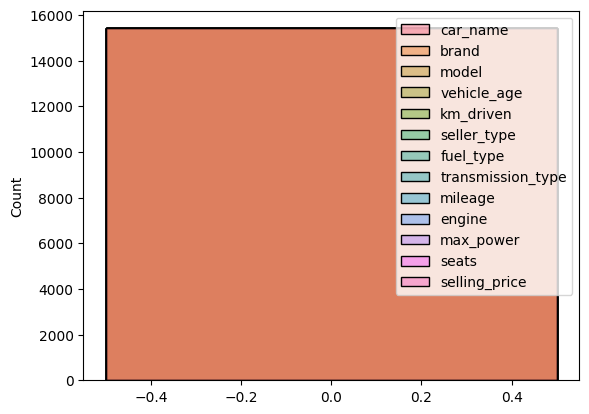

In [5]:
sns.histplot(df.isnull())


### **➡️1. Descriptive Analysis**  
- **Summary statistics**: Calculate mean, median, min, max, and standard deviation for **vehicle_age, km_driven, mileage, engine, max_power, selling_price** to understand data distribution.  
- **Count analysis**: Count of **brands, models, fuel types, seller types, and transmission types** to identify popular trends.  

In [6]:
col=['vehicle_age', 'km_driven','mileage', 'engine', 'max_power','selling_price']
def descriptive_analysis():
    for i in col:
        print(f'Mean of {i}: ',df[i].mean())
        print(f'Median of {i}: ',df[i].median())
        print(f'Min of {i}: ',df[i].min())
        print(f'Maximum of {i}: ',df[i].max())
        print(f'Standard Deviation of {i}: ',df[i].std())
        print(50*'---')
descriptive_analysis()

Mean of vehicle_age:  6.0363376808772955
Median of vehicle_age:  6.0
Min of vehicle_age:  0
Maximum of vehicle_age:  29
Standard Deviation of vehicle_age:  3.013291461417924
------------------------------------------------------------------------------------------------------------------------------------------------------
Mean of km_driven:  55616.48063071832
Median of km_driven:  50000.0
Min of km_driven:  100
Maximum of km_driven:  3800000
Standard Deviation of km_driven:  51618.548421789994
------------------------------------------------------------------------------------------------------------------------------------------------------
Mean of mileage:  19.70115112581922
Median of mileage:  19.67
Min of mileage:  4.0
Maximum of mileage:  33.54
Standard Deviation of mileage:  4.171264603904166
------------------------------------------------------------------------------------------------------------------------------------------------------
Mean of engine:  1486.0577509571085
Me

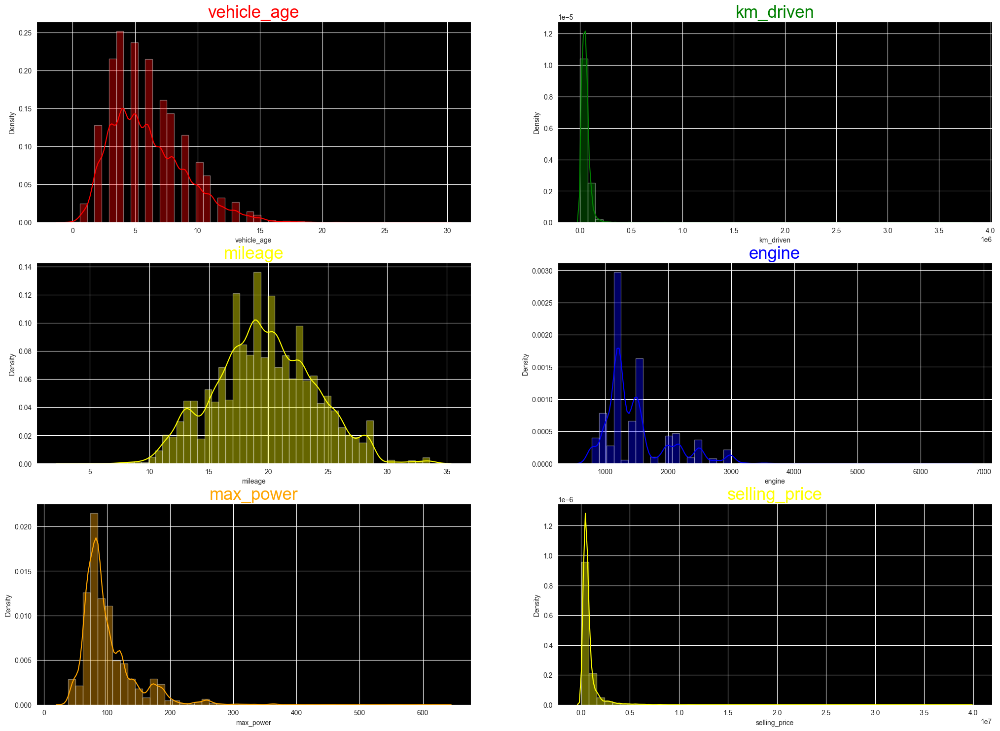

In [7]:
# Set the background to black
plt.style.use('dark_background')  # OR use sns.set_style
sns.set_style("darkgrid", {'axes.facecolor': 'black'})

j = 1
col = ['vehicle_age', 'km_driven', 'mileage', 'engine', 'max_power', 'selling_price']
colors = ['red', 'green', 'yellow', 'blue', 'orange', 'yellow']

plt.figure(figsize=(25, 18))

for i in col:
    plt.subplot(3, 2, j)
    plt.title(i, color=colors[j - 1], size=25)
    sns.distplot(df[i], kde=True, color=colors[j - 1])
    j += 1

plt.show()


In [8]:
## Column names & colors
col = ['vehicle_age', 'km_driven', 'mileage', 'engine', 'max_power', 'selling_price']
colors = ['red', 'green', 'yellow', 'blue', 'orange', 'cyan']
data=df[['vehicle_age', 'km_driven','mileage', 'engine','max_power','selling_price']]


## Create subplots
fig = sp.make_subplots(rows=3, cols=2, subplot_titles=col)



## Add each feature to a subplot
for i, feature in enumerate(col):
    fig.add_trace(
        go.Histogram(x=data[feature], histnorm='probability density', marker_color=colors[i], opacity=0.7),
        row=(i // 2) + 1, col=(i % 2) + 1
    )


## Update layout
fig.update_layout(
    title="Distribution Plots of Car Features",
    showlegend=False,
    height=1000, width=1420,
    template="plotly_dark"
)

# Show plot
fig.show()


**Count analysis**: Count of **brands, models, fuel types, seller types, and transmission types** to identify popular trends. 

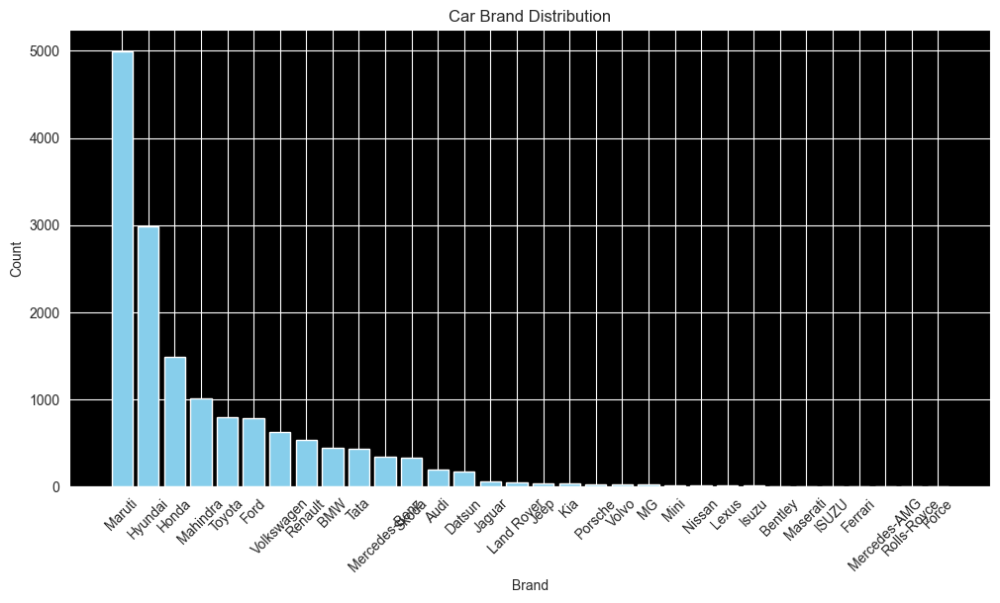

In [9]:
brand_counts = df['brand'].value_counts()

## Figure Car Brand Papularity:
fig = px.bar(
    x=brand_counts.index, 
    y=brand_counts.values, 
    labels={'x': 'Brand', 'y': 'Count'},
    title="Car Brand Distribution",
    text_auto=True,
    color=brand_counts.values, 
)
fig.update_layout(template="plotly_dark")


## Figure Car Brand Papularity:   
brand_counts = df['brand'].value_counts()

plt.figure(figsize=(12, 6))
plt.bar(brand_counts.index, brand_counts.values, color='skyblue')
plt.xlabel("Brand")
plt.ylabel("Count")
plt.title("Car Brand Distribution")
plt.xticks(rotation=45)  # Rotate x-axis labels for readability
fig.show()
plt.show()



In [10]:
model_counts = df['model'].value_counts()

## Figure Car model Papularity:
fig = px.bar(
    x=model_counts.index, 
    y=model_counts.values, 
    labels={'x': 'model', 'y': 'Count'},
    title="Car model Distribution",
    text_auto=True,
    color=model_counts.values, 
)
fig.update_layout(template="plotly_dark")
fig.show()


In [11]:
fuel_type_counts = df['fuel_type'].value_counts()

## Figure Car fuel_type Papularity:
fig = px.bar(
    x=fuel_type_counts.index, 
    y=fuel_type_counts.values, 
    labels={'x': 'fuel_type', 'y': 'Count'},
    title="Car fuel_type Distribution",
    text_auto=True,
    color=fuel_type_counts.values, 
)
fig.update_layout(template="plotly_dark")
fig.show()
plt.show()



In [12]:
seller_type_counts = df['seller_type'].value_counts()

## Figure Car seller_type Papularity:
fig = px.bar(
    x=seller_type_counts.index, 
    y=seller_type_counts.values, 
    labels={'x': 'seller_type', 'y': 'Count'},
    title="Car seller_type Distribution",
    text_auto=True,
    color=seller_type_counts.values, 
)
fig.update_layout(template="plotly_dark")

fig.show()
plt.show()



In [13]:
transmission_type_counts = df['transmission_type'].value_counts()

## Figure Car transmission_type Papularity:
fig = px.bar(
    x=transmission_type_counts.index, 
    y=transmission_type_counts.values, 
    labels={'x': 'transmission_type', 'y': 'Count'},
    title="Car transmission_type Distribution",
    text_auto=True,
    color=transmission_type_counts.values, 
)

fig.update_layout(template="plotly_dark")
fig.show()
plt.show()



### **➡️2. Price Optimization Analysis**  
- **Pricing trends**:  
  - Analyze how **selling_price** varies across different **brands, models, vehicle age, km driven, and fuel types**.  
  - Use **boxplots & histograms** to visualize price distribution.  
- **Price vs. Features**:  
  - Correlation between **selling_price** and features like **max_power, mileage, engine size, and vehicle_age** to understand key pricing factors.  
  - Identify features that **influence price the most**.  

In [14]:
## Selling Price Distribution Across Brands:
fig = px.bar(df, x='brand', y='selling_price', title="Selling Price Distribution Across Brands",
            color='brand', template="plotly_dark")
fig.update_layout(xaxis_tickangle=-45)
fig.show()


## Selling Price Distribution Across models:
fig = px.bar(df, x='model', y='selling_price', title="Selling Price Distribution Across models",
            color='model', template="plotly_dark")
fig.update_layout(xaxis_tickangle=-45)
fig.show()


## Selling Price Distribution Across vehicle_age:
fig = px.bar(df, x='vehicle_age', y='selling_price', title="Selling Price Distribution Across vehicle_age",
            color='vehicle_age', template="plotly_dark")
fig.update_layout(xaxis_tickangle=-45)
fig.show()


## Selling Price vs KM Driven:
fig = px.scatter(df, x='km_driven', y='selling_price', color='vehicle_age',
                title="Selling Price vs KM Driven", template="plotly_dark",
                trendline="ols")  # Add trendline for pattern analysis
fig.show()


## Selling Price vs. Fuel Type:
fig = px.box(df, x='fuel_type', y='selling_price', title="Selling Price vs. Fuel Type",
            color='fuel_type', template="plotly_dark")
fig.show()

## Selling Price Distribution Across vehicle_age:
fig = px.bar(df, x='vehicle_age', y='selling_price', title="Selling Price Distribution Across vehicle_age",
            color='vehicle_age', template="plotly_dark")
fig.update_layout(xaxis_tickangle=-45)
fig.show()

## **➡️💫Insights:-**

In [15]:
df.columns

Index(['car_name', 'brand', 'model', 'vehicle_age', 'km_driven', 'seller_type',
       'fuel_type', 'transmission_type', 'mileage', 'engine', 'max_power',
       'seats', 'selling_price'],
      dtype='object')

Use **boxplots & histograms** to visualize price distribution. 

In [16]:
fig = px.histogram(df, x='fuel_type', y='selling_price', title="Selling Price vs. Fuel Type",
            color='fuel_type', template="plotly_dark")
fig.show()

- **Price vs. Features**:  
  - Correlation between **selling_price** and features like **max_power, mileage, engine size, and vehicle_age** to understand key pricing factors.  
  - Identify features that **influence price the most**.  

In [17]:
# df[['selling_price','']]

In [18]:
x=df['max_power']
y=df['selling_price']
np.cov(x,y)

array([[1.84667693e+03, 2.88265907e+07],
       [2.88265907e+07, 7.99465530e+11]])

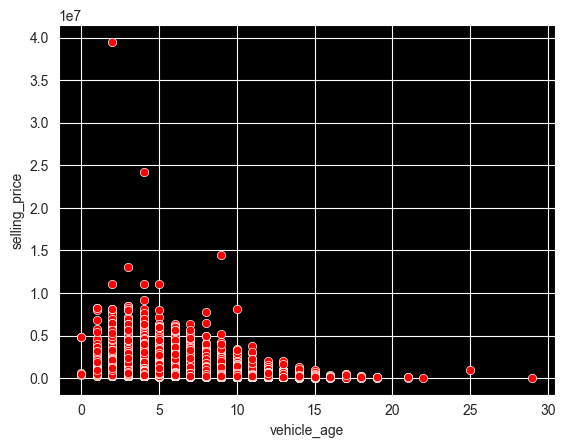

In [19]:
## Correlation Between Selling_prices & max_power...
fig=px.scatter(df,x='max_power',y='selling_price',title='Correlation b/w selling_price and max_power...',
            template='plotly_dark',
            trendline='ols')
fig.show()

## Correlation Between Selling_prices & mileage...
fig=px.scatter(df,x='mileage',y='selling_price',title='Correlation b/w selling_price and mileage...',
            template='plotly_dark',
            trendline='ols')
fig.show()

## Correlation Between Selling_prices & engine...
fig=px.scatter(df,x='engine',y='selling_price',title='Correlation b/w selling_price and engine...',
            template='plotly_dark',
            trendline='ols')
fig.show()
plt.show()


## Correlation Between Selling_prices & vehical_age... 
fig=px.scatter(df,y='vehicle_age',x='selling_price',title='Correlation b/w selling_price and vehical_age...',
            template='plotly_dark',
            trendline='ols')

sns.scatterplot(x='vehicle_age',y='selling_price',data=df,color='red')
fig.show()
plt.show()



## **➡️💫Insights:-**


### **➡️3. Demand & Market Trends Analysis**  
- **Popular brands & models**: Find the most frequently sold **car brands and models**.  



- **Seasonality trends**: Check if sales vary based on months (higher/lower selling months).  
- **Fuel Type Preference**: Compare demand for **Petrol, Diesel, CNG, Electric** cars based on their selling frequency.  
- **Transmission Type Analysis**: Analyze the popularity of **automatic vs. manual** cars.  
- **Seller Type Performance**: Compare individual vs. dealer sales.  


### **4. Mileage & Performance Insights**  
- **Mileage vs. Selling Price**: Higher mileage cars usually sell at lower prices. Visualize this using scatter plots.  
- **Engine Size & Power Impact**: Analyze how engine capacity and max power affect the price and demand.  


In [20]:
px.scatter(df,y='mileage',x='selling_price',
        title='Mileage vs Selling Prices',
        template='plotly_dark',
            trendline='ols')

## **➡️💫Insights:-**

- **Engine Size & Power Impact**: Analyze how engine capacity and max power affect the price and demand.  

In [21]:
input_data=df[['engine','max_power']]
output_data=df['selling_price']


### **5. Vehicle Age & Depreciation Analysis**  
- **Depreciation Curve**:  
  - Analyze how car price decreases with **vehicle_age** using regression models.  
  - Identify the best **resale value age range** for selling.  


In [22]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score

In [23]:
df2 = df[['vehicle_age', 'selling_price']]

In [24]:
df2 = df2.sort_values(by='vehicle_age')
X = df2[['vehicle_age']].values
y = df2['selling_price'].values

In [25]:
## Linear Regression Model
linear_model = LinearRegression()
linear_model.fit(X, y)
y_pred_linear = linear_model.predict(X)

## Polynomial Regression (degree 2)
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)

poly_model = LinearRegression()
poly_model.fit(X_poly, y)
y_pred_poly = poly_model.predict(X_poly)

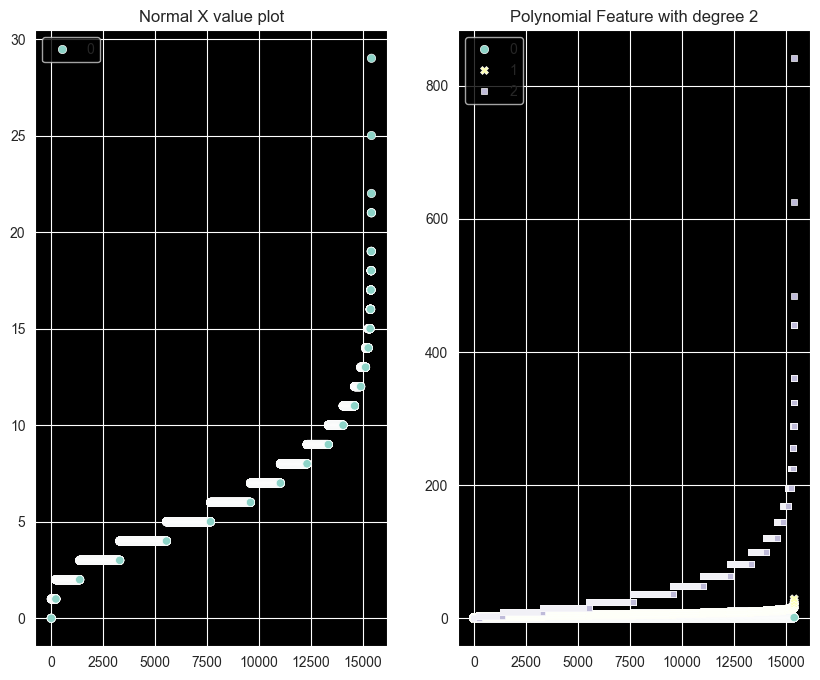

In [26]:
plt.figure(figsize=(10,8))
plt.subplot(1,2,1)
plt.title('Normal X value plot')
sns.scatterplot(X)


plt.subplot(1,2,2)
plt.title('Polynomial Feature with degree 2')
sns.scatterplot(X_poly)
plt.show()

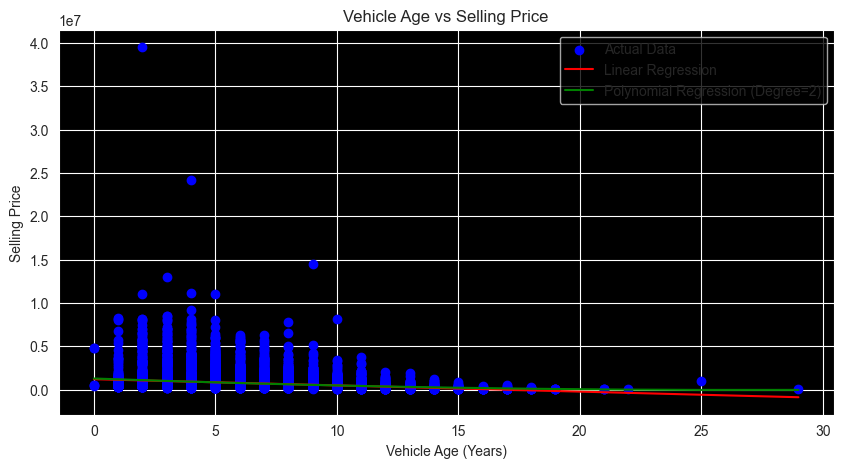

Linear Regression R² Score: 0.0585
Polynomial Regression R² Score: 0.0592


In [27]:
plt.figure(figsize=(10,5))
plt.scatter(X, y, color='blue', label='Actual Data')

## Linear Regression Line
plt.plot(X, y_pred_linear, color='red', label='Linear Regression')

## Polynomial Regression Curve
plt.plot(X, y_pred_poly, color='green', label='Polynomial Regression (Degree=2)')
plt.xlabel("Vehicle Age (Years)")
plt.ylabel("Selling Price")
plt.title("Vehicle Age vs Selling Price")
plt.legend()
plt.show()

## Print R-squared scores
print(f"Linear Regression R² Score: {r2_score(y, y_pred_linear):.4f}")
print(f"Polynomial Regression R² Score: {r2_score(y, y_pred_poly):.4f}")

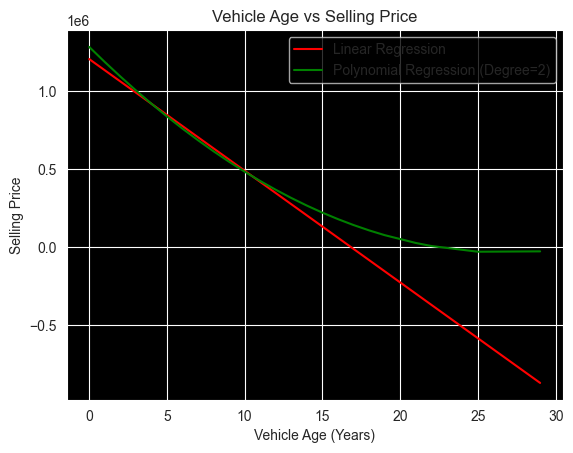

In [28]:
## Linear Regression Line
plt.plot(X, y_pred_linear, color='red', label='Linear Regression')

## Polynomial Regression Curve
plt.plot(X, y_pred_poly, color='green', label='Polynomial Regression (Degree=2)')
plt.xlabel("Vehicle Age (Years)")
plt.ylabel("Selling Price")
plt.title("Vehicle Age vs Selling Price")
plt.legend()
plt.show()


## **➡️💫Insights:-**
From the given scatter plot of **Vehicle Age vs. Selling Price**, we can derive the following insights:

1. **Negative Correlation**:  
   - As the vehicle age increases, the selling price generally decreases.  
   - This suggests that older vehicles have lower market value.

2. **Non-Linear Relationship**:  
   - The price drop is **steep in the initial years** (0-10 years), indicating rapid depreciation.  
   - After 10 years, the decline slows, meaning older cars retain some minimal value over time.

3. **Outliers Present**:  
   - Some points are significantly above the general trend, indicating rare cases where older vehicles are valued higher, possibly due to **luxury or collector models**.

4. **Regression Analysis**:  
   - The **linear regression model (red line)** shows a steady decline.  
   - The **polynomial regression model (green line)** slightly captures the curvature, indicating non-linearity.

### **Business Implications**
- **Pricing Strategy**: Dealers should price used cars based on age, with sharper reductions in the first 5-10 years.
- **Customer Targeting**: Buyers looking for budget cars may find the best value in 10+ year-old vehicles.
- **Feature Importance**: Vehicle age is a **strong predictor** of selling price.

🔴- Identify the best **resale value age range** for selling

In [29]:
count_data=df2['vehicle_age'].value_counts()
count_data.columns=['vehicle_age', 'count']
df2=df2.merge(count_data, on='vehicle_age', how='left')

In [30]:
fig=px.bar(df2,x=df2['vehicle_age'],y=df['selling_price'],title='resale value age range')
## Add text annotations for value counts
fig.update_traces(text=df2['count'], textposition='outside')
fig.show()
plt.show()

## **➡️💫Insights:-**
### **from the Given Figure (Resale Value Age Range)**

1. **Peak Resale Listings Between 3-6 Years**  
   - The highest resale activity occurs for vehicles aged **3 to 6 years**, with **peak listings at age 4 (2252 listings)**.  
   - This suggests that most owners sell their cars within this range, possibly due to warranty expiration, declining performance, or upgrade trends.

2. **Gradual Decline in Resale Listings After 6 Years**  
   - The number of resale listings **decreases significantly after 6 years**, with a steep drop beyond **10 years**.  
   - Older vehicles have a lower resale market presence, likely due to depreciation, maintenance costs, and reduced demand.

3. **Minimal Resale Activity Beyond 15 Years**  
   - Very few vehicles are resold beyond **15 years of age**, with **only a handful of listings above 20 years**.  
   - This indicates that cars beyond this age are either scrapped, kept for personal use, or rarely resold due to low market demand.

4. **Market Trends and Consumer Behavior**  
   - Car owners prefer to **sell within the first 5-6 years**, aligning with manufacturer warranties and optimal resale value.  
   - Older cars (10+ years) have a **lower resale value** and are sold less frequently.

### **Business Implications**
- **Dealership Strategy**:  
  - Focus on acquiring and reselling **3-6-year-old** vehicles, as they have the highest demand.  
  - Offer better trade-in deals for older cars to incentivize sellers.

- **Customer Buying Advice**:  
  - Buyers looking for a balance between **price and reliability** should target cars aged **3-6 years**.  
  - Bargain buyers may find lower-priced options in **7-10-year-old** cars.




## **👋🏻👋🏻6. Customer Preferences & Recommendation System👋🏻👋🏻** 


### 🔴**Predict best car models for buyers**: Use **clustering** (K-means) to segment customers based on budget and preferences.



In [31]:
df1=df

In [32]:
df1.isnull().sum()

car_name             0
brand                0
model                0
vehicle_age          0
km_driven            0
seller_type          0
fuel_type            0
transmission_type    0
mileage              0
engine               0
max_power            0
seats                0
selling_price        0
dtype: int64

- Create the cluster for budget basis we can select the most importent features like `selling_prices`, `mileage`, `max_power` ,`engine size` value and Age of vehical:-

In [33]:
X_data=df1[['selling_price', 'mileage', 'max_power', 'engine', 'vehicle_age']]

In [34]:
X_data.head()

,selling_price,mileage,max_power,engine,vehicle_age
0,120000,19.70,46.30,796,9
1,550000,18.90,82.00,1197,5
2,215000,17.00,80.00,1197,11
3,226000,20.92,67.10,998,9
4,570000,22.77,98.59,1498,6


In [35]:
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN 
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OrdinalEncoder,LabelEncoder,OneHotEncoder

In [36]:
numerical_columns=X_data.select_dtypes(exclude='object')
categorical_columns=X_data.select_dtypes(include='object')

In [37]:

## Numerical Pipeline:-
numerical_pipeline=Pipeline(steps=[
    ('SimpleImputer',SimpleImputer(strategy='median')),
    ('Scaler',StandardScaler())
])

## Categorical Pipeline:-
categorical_pipeline=Pipeline(steps=[
    ('SimpleImputer',SimpleImputer(strategy='most_frequent')),
    ('OrdinalEncoder',OrdinalEncoder()),
    ('Scaler', StandardScaler())
])

NameError: name 'StandardScaler' is not defined

In [495]:
## Combine both Pipelines:-
preprcosser=ColumnTransformer([
    ('Numercal_pipeline',numerical_pipeline,numerical_columns.columns.tolist()),
    ('Categorical_pipeline',categorical_pipeline,categorical_columns.columns.tolist())
])

In [496]:
preprcosser

ColumnTransformer(transformers=[('Numercal_pipeline',
                                 Pipeline(steps=[('SimpleImputer',
                                                  SimpleImputer(strategy='median')),
                                                 ('Scaler', MinMaxScaler())]),
                                 ['selling_price', 'mileage', 'max_power',
                                  'engine', 'vehicle_age']),
                                ('Categorical_pipeline',
                                 Pipeline(steps=[('SimpleImputer',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('OrdinalEncoder',
                                                  OrdinalEncoder()),
                                                 ('Scaler', MinMaxScaler())]),
                                 [])])

In [497]:
x_data=pd.DataFrame(preprcosser.fit_transform(X_data),columns=preprcosser.get_feature_names_out())

In [498]:
x_data

,Numercal_pipeline__selling_price,Numercal_pipeline__mileage,Numercal_pipeline__max_power,Numercal_pipeline__engine,Numercal_pipeline__vehicle_age
0,0.002027,0.531483,0.013445,0.000517,0.310345
1,0.012924,0.504401,0.074200,0.069667,0.172414
2,0.004435,0.440081,0.070796,0.069667,0.379310
3,0.004714,0.572783,0.048843,0.035351,0.310345
4,0.013431,0.635410,0.102434,0.121573,0.206897
...,...,...,...,...,...
15406,0.005322,0.535206,0.050459,0.050526,0.310345
15407,0.022428,0.457007,0.089687,0.100017,0.068966
15408,0.009757,0.580230,0.110824,0.121573,0.206897
15409,0.030030,0.406229,0.172907,0.239007,0.172414


- Finding the number of cluster using WCSS method(Elbow Method):

In [499]:
inertia = []
K_range = range(1, 11)
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(x_data)
    inertia.append(kmeans.inertia_)

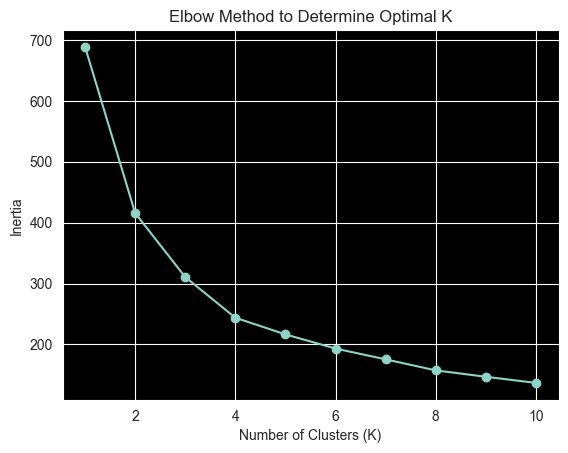

In [500]:
## Plot the elbow curve
plt.plot(K_range, inertia, marker='o')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Inertia')
plt.title('Elbow Method to Determine Optimal K')
plt.show()

In [501]:
kmeans=KMeans(n_clusters=3,random_state=42,n_init=10)
df['cluster']=kmeans.fit_predict(x_data)

In [502]:
df1[['car_name', 'selling_price', 'cluster']].head()

,car_name,selling_price,cluster
0,Maruti Alto,120000,2
1,Hyundai Grand,550000,2
2,Hyundai i20,215000,2
3,Maruti Alto,226000,2
4,Ford Ecosport,570000,1


In [503]:
df1.head()

,car_name,brand,model,vehicle_age,km_driven,seller_type,fuel_type,transmission_type,mileage,engine,max_power,seats,selling_price,cluster
0,Maruti Alto,Maruti,Alto,9,120000,Individual,Petrol,Manual,19.70,796,46.30,5,120000,2
1,Hyundai Grand,Hyundai,Grand,5,20000,Individual,Petrol,Manual,18.90,1197,82.00,5,550000,2
2,Hyundai i20,Hyundai,i20,11,60000,Individual,Petrol,Manual,17.00,1197,80.00,5,215000,2
3,Maruti Alto,Maruti,Alto,9,37000,Individual,Petrol,Manual,20.92,998,67.10,5,226000,2
4,Ford Ecosport,Ford,Ecosport,6,30000,Dealer,Diesel,Manual,22.77,1498,98.59,5,570000,1


- `Average` **selling price**, **mileage**, and **engine size** value for each cluster:

In [504]:
df1[['selling_price','mileage','engine','cluster']].groupby('cluster').mean()

,selling_price,mileage,engine
cluster,,,
0,1.610098e+06,14.482596,2332.180288
1,5.981259e+05,23.987084,1225.306388
2,5.101599e+05,18.685759,1286.239776


In [505]:
df1[df1['cluster']==0]['selling_price'].max()

39500000

In [506]:
df1[df1['cluster']==2]['selling_price'].max()

3400000

In [507]:
df1[df1['cluster']==1]['selling_price'].max()

6975000

In [508]:
## Save clustered data
df1.to_csv(r"D:\CarDekhoModel\artifacts\clustered_cars.csv", index=False)
print("Clustered data saved as clustered_cars.csv")

Clustered data saved as clustered_cars.csv


In [584]:
## Car recommendation function:-
def car_recommendation(budget):
    recommend_car=df1[(df1['selling_price']<=budget) & (df1['cluster']==1)]
    print(recommend_car[['car_name','selling_price','mileage','engine','max_power','seats','fuel_type','vehicle_age','km_driven']])
    
car_recommendation(600000)

                 car_name  selling_price  mileage  engine  max_power  seats  \
4           Ford Ecosport         570000    22.77    1498      98.59      5   
7          Maruti Wagon R         410000    20.51     998      67.04      5   
16           Maruti Swift         425000    28.40    1248      74.00      5   
25     Maruti Swift Dzire         600000    26.59    1248      74.00      5   
26     Maruti Swift Dzire         390000    26.59    1248      74.00      5   
...                   ...            ...      ...     ...        ...    ...   
15399        Renault KWID         485000    24.04     999      67.00      5   
15400         Maruti Alto         313000    24.70     796      47.30      5   
15401        Maruti Swift         590000    22.00    1197      81.80      5   
15402         Honda Amaze         525000    25.80    1498      98.60      5   
15403        Renault KWID         395000    25.17     799      53.30      5   

      fuel_type  vehicle_age  km_driven  
4        

In [585]:
car_recommendation(600000)

                 car_name  selling_price  mileage  engine  max_power  seats  \
4           Ford Ecosport         570000    22.77    1498      98.59      5   
7          Maruti Wagon R         410000    20.51     998      67.04      5   
16           Maruti Swift         425000    28.40    1248      74.00      5   
25     Maruti Swift Dzire         600000    26.59    1248      74.00      5   
26     Maruti Swift Dzire         390000    26.59    1248      74.00      5   
...                   ...            ...      ...     ...        ...    ...   
15399        Renault KWID         485000    24.04     999      67.00      5   
15400         Maruti Alto         313000    24.70     796      47.30      5   
15401        Maruti Swift         590000    22.00    1197      81.80      5   
15402         Honda Amaze         525000    25.80    1498      98.60      5   
15403        Renault KWID         395000    25.17     799      53.30      5   

      fuel_type  vehicle_age  km_driven  
4        

Text(0, 0.5, 'Euclidian Distances')

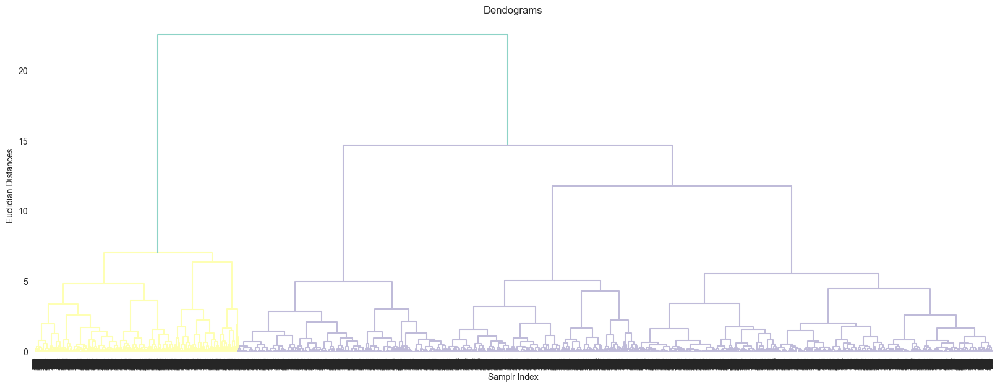

In [510]:
import scipy.cluster.hierarchy as sc
plt.figure(figsize=(20,7))
plt.title("Dendograms")

sc.dendrogram(sc.linkage(x_data,method="ward"))
plt.title("Dendograms")
plt.xlabel("Samplr Index")
plt.ylabel("Euclidian Distances")


In [511]:
cluster=AgglomerativeClustering(n_clusters=2,linkage="ward")
cluster.fit(x_data)

AgglomerativeClustering()

In [512]:
cluster.labels_

array([0, 0, 0, ..., 0, 1, 0], dtype=int64)

In [513]:
from sklearn.metrics import silhouette_score

In [514]:
silhouette_cofficients=[]
for k in range(2,11):
    agglo=AgglomerativeClustering(n_clusters=k,linkage="ward")
    agglo.fit(x_data)
    score=silhouette_score(x_data,agglo.labels_)
    silhouette_cofficients.append(score)

In [515]:
dbscan=DBSCAN(eps=0.5)

In [516]:
dbscan.fit(x_data)

DBSCAN()

In [517]:
dbscan.labels_

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [518]:
x_data

,Numercal_pipeline__selling_price,Numercal_pipeline__mileage,Numercal_pipeline__max_power,Numercal_pipeline__engine,Numercal_pipeline__vehicle_age
0,0.002027,0.531483,0.013445,0.000517,0.310345
1,0.012924,0.504401,0.074200,0.069667,0.172414
2,0.004435,0.440081,0.070796,0.069667,0.379310
3,0.004714,0.572783,0.048843,0.035351,0.310345
4,0.013431,0.635410,0.102434,0.121573,0.206897
...,...,...,...,...,...
15406,0.005322,0.535206,0.050459,0.050526,0.310345
15407,0.022428,0.457007,0.089687,0.100017,0.068966
15408,0.009757,0.580230,0.110824,0.121573,0.206897
15409,0.030030,0.406229,0.172907,0.239007,0.172414


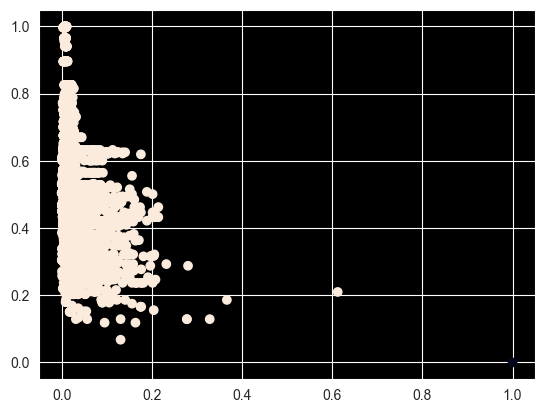

In [519]:
plt.scatter(x_data['Numercal_pipeline__selling_price'],x_data['Numercal_pipeline__mileage'],c=dbscan.labels_)

### **🔴Recommendation engine**: Build an ML model to suggest cars based on user inputs like **budget, fuel type, transmission, and brand preference**.  

In [520]:
df.head()

,car_name,brand,model,vehicle_age,km_driven,seller_type,fuel_type,transmission_type,mileage,engine,max_power,seats,selling_price,cluster
0,Maruti Alto,Maruti,Alto,9,120000,Individual,Petrol,Manual,19.70,796,46.30,5,120000,2
1,Hyundai Grand,Hyundai,Grand,5,20000,Individual,Petrol,Manual,18.90,1197,82.00,5,550000,2
2,Hyundai i20,Hyundai,i20,11,60000,Individual,Petrol,Manual,17.00,1197,80.00,5,215000,2
3,Maruti Alto,Maruti,Alto,9,37000,Individual,Petrol,Manual,20.92,998,67.10,5,226000,2
4,Ford Ecosport,Ford,Ecosport,6,30000,Dealer,Diesel,Manual,22.77,1498,98.59,5,570000,1


In [521]:
rec_data=df[['selling_price','fuel_type','transmission_type','model']]


### **7. Outlier & Fraud Detection**  
- Detect **unrealistic prices**, **manipulated mileage**, or **fake sellers** using anomaly detection techniques.  


In [522]:
df.head()

,car_name,brand,model,vehicle_age,km_driven,seller_type,fuel_type,transmission_type,mileage,engine,max_power,seats,selling_price,cluster
0,Maruti Alto,Maruti,Alto,9,120000,Individual,Petrol,Manual,19.70,796,46.30,5,120000,2
1,Hyundai Grand,Hyundai,Grand,5,20000,Individual,Petrol,Manual,18.90,1197,82.00,5,550000,2
2,Hyundai i20,Hyundai,i20,11,60000,Individual,Petrol,Manual,17.00,1197,80.00,5,215000,2
3,Maruti Alto,Maruti,Alto,9,37000,Individual,Petrol,Manual,20.92,998,67.10,5,226000,2
4,Ford Ecosport,Ford,Ecosport,6,30000,Dealer,Diesel,Manual,22.77,1498,98.59,5,570000,1


In [523]:
df.columns

Index(['car_name', 'brand', 'model', 'vehicle_age', 'km_driven', 'seller_type',
       'fuel_type', 'transmission_type', 'mileage', 'engine', 'max_power',
       'seats', 'selling_price', 'cluster'],
      dtype='object')

In [524]:
X=df.drop(['selling_price','brand', 'model','cluster'],axis=1)
y=df['selling_price']

In [525]:
X.head(5)

,car_name,vehicle_age,km_driven,seller_type,fuel_type,transmission_type,mileage,engine,max_power,seats
0,Maruti Alto,9,120000,Individual,Petrol,Manual,19.70,796,46.30,5
1,Hyundai Grand,5,20000,Individual,Petrol,Manual,18.90,1197,82.00,5
2,Hyundai i20,11,60000,Individual,Petrol,Manual,17.00,1197,80.00,5
3,Maruti Alto,9,37000,Individual,Petrol,Manual,20.92,998,67.10,5
4,Ford Ecosport,6,30000,Dealer,Diesel,Manual,22.77,1498,98.59,5


In [551]:
selling_prices_categorical_columns=X.select_dtypes(include='O')
selling_prices_numerical_columns=X.select_dtypes(exclude='O')

In [552]:
selling_prices_numerical_columns

,vehicle_age,km_driven,mileage,engine,max_power,seats
0,9,120000,19.70,796,46.30,5
1,5,20000,18.90,1197,82.00,5
2,11,60000,17.00,1197,80.00,5
3,9,37000,20.92,998,67.10,5
4,6,30000,22.77,1498,98.59,5
...,...,...,...,...,...,...
15406,9,10723,19.81,1086,68.05,5
15407,2,18000,17.50,1373,91.10,7
15408,6,67000,21.14,1498,103.52,5
15409,5,3800000,16.00,2179,140.00,7


In [528]:
## Using Ordinal Encoder we are encoded this value into numerical form according to the given preference values:

categories=[
## car_name	 Value Order for Encoding:
    ['Force Gurkha','Hyundai Aura', 'Ferrari GTC4Lusso','Tata Altroz','Mercedes-AMG C', 'Maserati Ghibli','Rolls-Royce Ghost', 'Maserati Quattroporte',  'Isuzu MUX','Maruti Dzire LXI',
'Lexus NX', 'Jeep Wrangler',  'Lexus RX',  'ISUZU MUX',  'Porsche Macan', 'Mahindra Alturas','Porsche Panamera','Nissan X-Trail', 'Jaguar F-PACE', 'Bentley Continental', 'Honda CR',
'Volvo S90','Kia Carnival','Jaguar XE','Volvo XC90','Maruti Dzire ZXI','Volvo XC60', 'Lexus ES', 'BMW Z4', 'BMW X4', 'Audi A8',  'Isuzu D-Max', 'Maruti XL6', 'Volvo XC','Toyota Glanza',
'Nissan Kicks','Mercedes-Benz CLS','Hyundai Tucson', 'Datsun redi-GO', 'Mercedes-Benz GLS', 'Renault Triber','Maruti S-Presso',  'Mahindra XUV300','Porsche Cayenne','Maruti Dzire VXI',
'Mini Cooper','Toyota Yaris','BMW 6','MG Hector', 'Tata Harrier', 'BMW X3','Audi Q7', 'Mahindra Marazzo','BMW X5','Mahindra KUV100','Kia Seltos','Honda CR-V','Ford Freestyle','Mercedes-Benz GL-Class',
'Toyota Camry','Tata Tigor','BMW 7','Mercedes-Benz S-Class','Jeep Compass','Tata Hexa','Ford Endeavour','Hyundai Elantra','Land Rover Rover','Jaguar XF','BMW X1','Hyundai Venue','Honda Civic',
'Skoda Octavia','Mahindra Thar','Audi A6','Ford Aspire','Mahindra KUV','Maruti Ignis','Datsun RediGO','Datsun GO','Tata Nexon','Skoda Superb','Audi A4','Tata Safari','Honda WR-V','Mercedes-Benz C-Class',
'BMW 5','Maruti Eeco','Mercedes-Benz E-Class','Hyundai Santro','Tata Tiago','BMW 3','Honda Jazz','Skoda Rapid','Toyota Fortuner','Mahindra Bolero','Renault Duster','Maruti Celerio','Volkswagen Vento',
'Ford Figo','Mahindra Scorpio','Maruti Vitara','Renault KWID','Mahindra XUV500','Hyundai Creta','Maruti Ertiga','Maruti Ciaz','Honda Amaze','Maruti Baleno','Volkswagen Polo','Ford Ecosport','Hyundai i10',
'Hyundai Verna','Toyota Innova','Hyundai Grand','Maruti Wagon R','Honda City','Maruti Alto','Maruti Swift','Maruti Swift Dzire','Hyundai i20'],
    
## seller_type	Value Order for Encoding:
['Trustmark Dealer', 'Individual', 'Dealer'],

## fuel_type Value Order for Encoding:	
['Electric', 'LPG', 'CNG', 'Diesel', 'Petrol'],

## transmission_type Value Order for Encoding:
['Automatic', 'Manual']
]

In [562]:
## Numerical Pipeline:-
numerical_pipeline=Pipeline(steps=[
    ('SimpleImputer',SimpleImputer(strategy='median')),
    ('Scaler',StandardScaler())
])

## Categorical Pipeline:-
categorical_pipeline=Pipeline(steps=[
    ('SimpleImputer',SimpleImputer(strategy='most_frequent')),
    ('OrdinalEncoder',OrdinalEncoder(categories=categories)),
    ('Scaler', StandardScaler())
])

## Combine both Pipelines:-
preprcosser=ColumnTransformer([
    ('Numercal_pipeline',numerical_pipeline,selling_prices_numerical_columns.columns.tolist()),
    ('Categorical_pipeline',categorical_pipeline,selling_prices_categorical_columns.columns.tolist())
])

In [563]:
preprcosser

ColumnTransformer(transformers=[('Numercal_pipeline',
                                 Pipeline(steps=[('SimpleImputer',
                                                  SimpleImputer(strategy='median')),
                                                 ('Scaler', StandardScaler())]),
                                 ['vehicle_age', 'km_driven', 'mileage',
                                  'engine', 'max_power', 'seats']),
                                ('Categorical_pipeline',
                                 Pipeline(steps=[('SimpleImputer',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('OrdinalEncoder',
                                                  OrdinalEncoder(c...
                                                                              'Continental',
                                                                              'Honda '
                                                                              'CR',
                                                                              'Volvo '
                                                                              'S90',
                                                                              'Kia '
                                                                              'Carnival',
                                                                              'Jaguar '
                                                                              'XE',
                                                                              'Volvo '
                                                                              'XC90',
                                                                              'Maruti '
                                                                              'Dzire '
                                                                              'ZXI',
                                                                              'Volvo '
                                                                              'XC60',
                                                                              'Lexus '
                                                                              'ES',
                                                                              'BMW '
                                                                              'Z4',
                                                                              'BMW '
                                                                              'X4', ...],
                                                                             ['Trustmark '
                                                                              'Dealer',
                                                                              'Individual',
                                                                              'Dealer'],
                                                                             ['Electric',
                                                                              'LPG',
                                                                              'CNG',
                                                                              'Diesel',
                                                                              'Petrol'],
                                                                             ['Automatic',
                                                                              'Manual']])),
                                                 ('Scaler', StandardScaler())]),
                                 ['car_name', 'seller_type', 'fuel_type',
                                  'transmission_type'])])

In [531]:
from sklearn.model_selection import train_test_split

In [532]:
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.20,random_state=128)

In [533]:
x_train.shape,y_train.shape,x_test.shape,y_test.shape

((12328, 10), (12328,), (3083, 10), (3083,))

In [564]:
X_train=preprcosser.fit_transform(x_train)
X_test=preprcosser.transform(x_test)

In [565]:
X_train=pd.DataFrame(preprcosser.fit_transform(x_train),columns=preprcosser.get_feature_names_out())
X_test=pd.DataFrame(preprcosser.transform(x_test),columns=preprcosser.get_feature_names_out())

In [536]:
## For finding the ANOMLY AND OUTLIERS WE CAN USED IsolationForest, DBSCAN, LOCALOUTLIERFACTOR METHODS:-
from sklearn.decomposition import PCA
from sklearn.ensemble import IsolationForest
from sklearn.cluster import DBSCAN
from sklearn.neighbors import LocalOutlierFactor

In [566]:
scaled_data=pd.concat([X_train,X_test])

In [567]:
## For Visulization we are convert dataset into 4D form:-    
pca=PCA(n_components=4,random_state=42)
pca_scaled_data=pd.DataFrame(pca.fit_transform(scaled_data))
pca_scaled_data['f1']=pca_scaled_data[0]
pca_scaled_data['f2']=pca_scaled_data[1]
pca_scaled_data['f3']=pca_scaled_data[2]
pca_scaled_data['f4']=pca_scaled_data[3]
pca_scaled_data=pca_scaled_data[['f1','f2','f3','f4']]

In [568]:
pca_scaled_data

,f1,f2,f3,f4
0,0.018945,2.241967,-0.591384,-0.752834
1,-1.013170,0.223641,1.372009,0.572587
2,0.186569,0.937273,-0.636707,-0.123731
3,2.554331,2.165182,-1.321276,-2.293528
4,-0.626622,0.702026,0.049372,0.874632
...,...,...,...,...
15406,-0.087372,-0.994783,0.489787,-0.388893
15407,1.884572,-0.693498,-1.309663,-0.972976
15408,-0.676275,-0.207325,-1.091127,1.057004
15409,-0.569576,0.302383,-0.621493,1.127559


In [569]:
fig=px.scatter_3d(pca_scaled_data,x='f1',y='f2',z='f3',
                color='f4',
                # size='f5',
                opacity=0.8,
                title='Distribution Plot Of Data'    
                )

fig.show()

In [570]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score, make_scorer

In [571]:
## Define Isolation Forest model
iso_forest = IsolationForest(random_state=42)

## Define a custom scoring function for anomaly detection
def isolation_forest_score(y_true, y_pred):
    """Convert predictions (1 -> 0, -1 -> 1) and compute F1-score."""
    y_pred_binary = np.where(y_pred == 1, 0, 1)  # Convert predictions
    y_true_binary = np.where(y_true == 1, 0, 1)  # Convert true labels
    return f1_score(y_true_binary, y_pred_binary)

# Create a scorer for GridSearchCV
custom_scorer = make_scorer(isolation_forest_score, greater_is_better=True)


## Define hyperparameter grid
param_grid = {
    "n_estimators": [50, 100, 150], 
    "max_samples": [0.5, 0.7, 1.0],  # Sample fraction
    "contamination": [0.05, 0.1, 0.2],  # Expected anomaly proportion
    "max_features": [1.0, 0.8, 0.6]  # Feature fraction
}

## GridSearchCV setup
grid_search = GridSearchCV(
    iso_forest,
    param_grid,
    scoring=custom_scorer,  # Uses internal scoring of Isolation Forest
    cv=3,  # Cross-validation folds
    verbose=1,
    n_jobs=-1
)

In [572]:
grid_search

GridSearchCV(cv=3, estimator=IsolationForest(random_state=42), n_jobs=-1,
             param_grid={'contamination': [0.05, 0.1, 0.2],
                         'max_features': [1.0, 0.8, 0.6],
                         'max_samples': [0.5, 0.7, 1.0],
                         'n_estimators': [50, 100, 150]},
             scoring=make_scorer(isolation_forest_score, response_method='predict'),
             verbose=1)

In [573]:
## Fit the grid search model
grid_search.fit(pca_scaled_data,df['selling_price'])

Fitting 3 folds for each of 81 candidates, totalling 243 fits


GridSearchCV(cv=3, estimator=IsolationForest(random_state=42), n_jobs=-1,
             param_grid={'contamination': [0.05, 0.1, 0.2],
                         'max_features': [1.0, 0.8, 0.6],
                         'max_samples': [0.5, 0.7, 1.0],
                         'n_estimators': [50, 100, 150]},
             scoring=make_scorer(isolation_forest_score, response_method='predict'),
             verbose=1)

In [574]:
# Best parameters
print("Best Parameters:", grid_search.best_params_)
# Train the best model
best_model = grid_search.best_estimator_

Best Parameters: {'contamination': 0.2, 'max_features': 0.6, 'max_samples': 1.0, 'n_estimators': 50}


In [546]:
## Predict anomalies (-1 = anomaly, 1 = normal)
y_pred = best_model.predict(pca_scaled_data)

pca_scaled_data['anomaly']=y_pred
## Convert predictions for evaluation (1 -> 0, -1 -> 1)
y_pred_binary = np.where(y_pred == 1, 0, 1)
y_true_binary = np.where(y == 1, 0, 1)

In [547]:
## -1 means Anomaly_data(1) and 1 is normal_data(0)
pca_scaled_data['anomaly']=pca_scaled_data['anomaly'].map({-1:'anomaly'
                                                        ,1:'normal'})

In [548]:
pca_scaled_data

,f1,f2,f3,f4,anomaly
0,-0.270593,0.251550,0.158874,0.065556,normal
1,-0.184920,-0.235673,-0.076374,-0.147001,normal
2,-0.248960,0.254815,0.067952,0.082784,normal
3,-0.221658,0.263176,0.388785,0.012620,normal
4,-0.181376,-0.239599,0.000636,0.017900,normal
...,...,...,...,...,...
15406,-0.153522,-0.222215,-0.013031,-0.126517,normal
15407,-0.169170,0.274935,0.281553,0.144274,anomaly
15408,-0.184845,-0.234926,-0.068969,0.179766,normal
15409,-0.183398,-0.237776,-0.039597,0.124854,normal


In [549]:
## Print evaluation metrics
print(classification_report(y_true_binary, y_pred_binary))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.20      0.33     15411

    accuracy                           0.20     15411
   macro avg       0.50      0.10      0.17     15411
weighted avg       1.00      0.20      0.33     15411



In [557]:
pca_scaled_data['anomaly'].value_counts()

anomaly
normal     12329
anomaly     3082
Name: count, dtype: int64

In [559]:
## Detect the Anomly
fig=px.scatter_3d(pca_scaled_data,x='f1',y='f2',z='f3',
                color='anomaly',
                # size='f4',
                opacity=1,
                title='Distribution Plot Of Data'    
                )
fig.show()

### **8. Predictive Modeling**  
- **Price Prediction Model**: Train a **regression model (XGBoost, Random Forest, etc.)** to predict selling price based on given features.  
- **Sales Forecasting**: Use **time-series forecasting** to predict future car sales.  


In [575]:
from sklearn.linear_model import LinearRegression,Lasso,Ridge,ElasticNet
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from xgboost import XGBRegressor

In [576]:
models={
    'Linear Regression':LinearRegression(),
    'Lasso':Lasso(),
    'Ridge':Ridge(),
    'ElasticNet':ElasticNet(),
    'SVR':SVR(),
    'Decision Tree Regressor':DecisionTreeRegressor(),
    'KNeighborsRegressor':KNeighborsRegressor(),
    'RandomForestRegressor':RandomForestRegressor(),
    'AdaBoostRegressor':AdaBoostRegressor(),
    'XGBRegressor':XGBRegressor()
}

In [577]:
params={
    'Linear Regression':{},
    'Lasso':{},
    'Ridge':{},
    'ElasticNet':{},

    'SVR':{
        # 'kernel':['linear', 'poly', 'rbf', 'sigmoid', 'precomputed'],
        'C':[0.1,0.5,1,1.5,2.5]
        },
    
    'Decision Tree Regressor':{
        'splitter':['best','random'],
        # 'criterion':['gini', 'entropy', 'log_loss'],
        'max_depth':[5,10,15,20,25,30,35,40,45,50],
        'max_features':['sqrt','log2']
        },

    'KNeighborsRegressor':{
        'n_neighbors':[3,4,5,6,7,8,9,10]
        },

    'RandomForestRegressor':{
        'criterion':['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
        'max_features':['sqrt','log2',None],
        'n_estimators': [8,16,32,64,128,256]
        },

    'AdaBoostRegressor':{},
    'XGBRegressor':{
        'learning_rate':[.1,.01,.05,.001],
        'n_estimators': [8,16,32,64,128,256]
    }
}

In [578]:
from sklearn.metrics import r2_score

In [579]:
def get_best_model(X_train,y_train,X_test,y_test,model_dict,params_,base_accuracy=0.65):
    models = model_dict.keys()
    for model in models:
        print(f'Initial base accuracy is {base_accuracy}')
        print(20*'*',"Estimator: ",model,20*'*')
        gs = GridSearchCV(estimator=model_dict[model],param_grid=params_[model],cv=3)
        gs.fit(X_train,y_train)
        print(f'Best parameters are :{gs.best_params_} With R2 score:{gs.best_score_}')
        
        regressor = model_dict[model].set_params(**gs.best_params_)
        regressor.fit(X_train,y_train)

        y_train_pred = regressor.predict(X_train)
        y_test_pred = regressor.predict(X_test)
        
        train_model_score = r2_score(y_train, y_train_pred)

        test_model_score = r2_score(y_test, y_test_pred)
        
        if test_model_score >= base_accuracy:
            print('Acceptabel model found!')
            base_accuracy = test_model_score
            best_model = {model:regressor}
        else:
            print('Model rejected\n',30*'__')
    print(f"Best model is:{list(best_model.keys())} with R2 Score: {round(test_model_score,2)}")        
    return best_model

In [580]:
get_best_model(X_train,y_train,X_test,y_test,model_dict=models,params_=params)

Initial base accuracy is 0.65
******************** Estimator:  Linear Regression ********************
Best parameters are :{} With R2 score:0.6325500127876607
Acceptabel model found!
Initial base accuracy is 0.680487227189023
******************** Estimator:  Lasso ********************
Best parameters are :{} With R2 score:0.6325503177827846
Model rejected
 ____________________________________________________________
Initial base accuracy is 0.680487227189023
******************** Estimator:  Ridge ********************
Best parameters are :{} With R2 score:0.6325531096053433
Acceptabel model found!
Initial base accuracy is 0.68050140195322
******************** Estimator:  ElasticNet ********************
Best parameters are :{} With R2 score:0.5933510842528221
Model rejected
 ____________________________________________________________
Initial base accuracy is 0.68050140195322
******************** Estimator:  SVR ********************
Best parameters are :{'C': 2.5} With R2 score:-0.059290

{'RandomForestRegressor': RandomForestRegressor(criterion='absolute_error', max_features=None,
                       n_estimators=32)}

## **👋🏻Accuracy of Diffrent Models:-👋🏻**
- Linear Regression - `R2 score::0.6325500127876607`
- Lasso - `R2 score:0.6325503177827846`
- Ridge - `R2 score: 0.6325531096053433`
- ElasticNet - `R2 score:0.5933510842528221`
- SVR - `R2 score:-0.0592908329225171`
- Decision Tree Regressor - `R2 score:0.8095249584738969`
- KNeighborsRegressor - `R2 score:0.8093798474645282`
- RandomForestRegressor - `R2 score:0.9280082440703388`
- AdaBoostRegressor - `R2 score: 0.6820144941779912`
- XGBRegressor - `R2 score: 0.8014389594774279`

In [582]:
model=RandomForestRegressor(criterion='absolute_error', max_features=None,n_estimators=128)

In [583]:
model.fit(X_train,y_train)

RandomForestRegressor(criterion='absolute_error', max_features=None,
                      n_estimators=128)



### **9. Customer Segmentation & Targeting**   
- **Car Preference Clustering**: Use **K-means clustering** to group buyers based on **budget, fuel type, transmission, and vehicle age preferences**.  
 


In [587]:
df.head(1)

,car_name,brand,model,vehicle_age,km_driven,seller_type,fuel_type,transmission_type,mileage,engine,max_power,seats,selling_price,cluster
0,Maruti Alto,Maruti,Alto,9,120000,Individual,Petrol,Manual,19.7,796,46.3,5,120000,2


In [588]:
preference_data=df[['selling_price','fuel_type','transmission_type','vehicle_age']]

In [590]:
preference_data.head()

,selling_price,fuel_type,transmission_type,vehicle_age
0,120000,Petrol,Manual,9
1,550000,Petrol,Manual,5
2,215000,Petrol,Manual,11
3,226000,Petrol,Manual,9
4,570000,Diesel,Manual,6


In [591]:
kmeans=KMeans(n_clusters=3,random_state=42,n_init=10)

In [595]:
    
## seller_type	Value Order for Encoding:
order=[
['Trustmark Dealer', 'Individual', 'Dealer'],

## fuel_type Value Order for Encoding:	
['Electric', 'LPG', 'CNG', 'Diesel', 'Petrol'],

## transmission_type Value Order for Encoding:
['Automatic', 'Manual']
]

In [597]:
preference_data.dtypes

selling_price         int64
fuel_type            object
transmission_type    object
vehicle_age           int64
dtype: object

In [599]:
c_value=preference_data.select_dtypes(include='object')
n_value=preference_data.select_dtypes(include='int64')

In [614]:
NUMERICAL_PIPELINE=Pipeline([
    'Imputer',SimpleImputer(strategy='median'),
    'scaler',StandardScaler()
])

CATEGORICAL_PIPELINE=Pipeline([
    'Imputer',SimpleImputer(strategy='most_friquent'),
    'encoder',OrdinalEncoder(categories=order),
    'scaler',StandardScaler()
])

In [615]:
PREPROCESSOR=ColumnTransformer([
    'NUMERICAL PIPELINE',NUMERICAL_PIPELINE,n_value.columns.tolist(),
    'CATEGORICAL PIPELINE',NUMERICAL_PIPELINE,c_value.columns.tolist()
])

In [619]:
preference_data.head()

,selling_price,fuel_type,transmission_type,vehicle_age
0,120000,Petrol,Manual,9
1,550000,Petrol,Manual,5
2,215000,Petrol,Manual,11
3,226000,Petrol,Manual,9
4,570000,Diesel,Manual,6


In [620]:
PREPROCESSOR

ColumnTransformer(transformers=['NUMERICAL PIPELINE',
                                Pipeline(steps=['Imputer',
                                                SimpleImputer(strategy='median'),
                                                'scaler', StandardScaler()]),
                                ['selling_price', 'vehicle_age'],
                                'CATEGORICAL PIPELINE',
                                Pipeline(steps=['Imputer',
                                                SimpleImputer(strategy='median'),
                                                'scaler', StandardScaler()]),
                                ['fuel_type', 'transmission_type']])

In [38]:
# PREPROCESSOR.fit_transform(preference_data)

- **Marketing Strategy**: Identify which **car features or brands** appeal to specific customer segments and target marketing efforts accordingly. 

### **10. Competitor & Market Comparison Analysis**  
- **Competitive Pricing Analysis**: Compare your car prices with competitors (if data available) to **optimize pricing strategies**.  
- **Brand Performance Benchmarking**: Identify which brands/models perform best against competitors in terms of **resale value & demand**.  


In [39]:
brand_name=df['brand'].unique().tolist()

In [40]:
df['brand'].unique()

array(['Maruti', 'Hyundai', 'Ford', 'Renault', 'Mini', 'Mercedes-Benz',
       'Toyota', 'Volkswagen', 'Honda', 'Mahindra', 'Datsun', 'Tata',
       'Kia', 'BMW', 'Audi', 'Land Rover', 'Jaguar', 'MG', 'Isuzu',
       'Porsche', 'Skoda', 'Volvo', 'Lexus', 'Jeep', 'Maserati',
       'Bentley', 'Nissan', 'ISUZU', 'Ferrari', 'Mercedes-AMG',
       'Rolls-Royce', 'Force'], dtype=object)


### **11. Inventory Optimization Analysis**  
- **Stock Turnover Rate**: Analyze how quickly different car models sell to optimize inventory levels.  
- **Slow-Moving Cars**: Identify **slow-selling models** and introduce discounts or marketing strategies to boost sales.  
- **Fast-Selling Cars**: Identify high-demand models and **prioritize stocking** them.  



### **12. Price Elasticity Analysis**  
- **Price Sensitivity Study**: Use historical data to see how price changes **affect demand** for different models.  
- **Discount Impact Analysis**: Measure how past **discounts & promotions** affected sales.  


### **13. Geospatial Analysis**  
- **Location-Based Sales Trends**: If location data is available, identify **high-demand areas** for certain brands/models.  
- **Regional Pricing Differences**: Adjust pricing based on city/state-wise demand and competition.  
- **Delivery Optimization**: Optimize **logistics & distribution** based on sales heatmaps.  



### **14. Sentiment & Review Analysis (If Customer Reviews are Available)**  
- **Customer Sentiment Analysis**: Use NLP techniques to analyze **customer reviews & feedback** on different brands and models.  
- **Feature-Based Review Analysis**: Identify which features (e.g., **mileage, comfort, engine power**) are most praised or criticized.  



### **15. Car Certification & Warranty Analysis**  
- **Impact of Certification on Sales**: Compare sales of **certified vs. non-certified pre-owned cars**.  
- **Warranty vs. Price**: Analyze how an **extended warranty** affects selling price and demand.  



### **16. Insurance & Maintenance Cost Analysis**  
- **Total Cost of Ownership**: Compare **insurance, maintenance, and fuel costs** for different brands & models.  
- **Predictive Maintenance**: If service records are available, predict which cars are likely to need maintenance soon, impacting resale value.  



### **17. Financing & Loan Impact Analysis**  
- **Loan vs. Cash Purchase Behavior**: Analyze how financing options impact sales.  
- **EMI Affordability Study**: Suggest car models based on **affordable monthly EMIs** for different customer segments.  



### **18. Customer Retention & Loyalty Analysis**  
- **Repeat Buyer Analysis**: Identify customers who have bought multiple cars and analyze their preferences.  
- **Loyalty Program Effectiveness**: Measure the impact of loyalty programs (discounts, referral bonuses) on repeat purchases.  
- **Customer Churn Prediction**: Build an ML model to predict which customers are likely to **stop buying from your platform** based on past behavior.  


### **19. Trade-In & Exchange Analysis**  
- **Trade-In Behavior Analysis**: Identify the most commonly exchanged car models and their resale trends.  
- **Trade-In Value Optimization**: Develop an ML model to suggest the **optimal trade-in price** based on market demand and car condition.  


### **20. Seller Performance Analysis**  
- **Dealer vs. Individual Performance**: Compare sales success rates, pricing strategies, and customer ratings of **dealers vs. private sellers**.  
- **Top-Performing Sellers**: Identify sellers with the **best conversion rates** and analyze their strategies.  
- **Salesperson Performance Tracking**: If sales are handled by teams, track **sales success rates per employee**.  


### **21. Vehicle Inspection & Damage Impact Analysis**  
- **Accident History Impact**: Analyze how previous **accidents or repairs** affect resale value.  
- **Vehicle Condition Scoring**: Develop a **car condition scoring system** based on past maintenance records and mileage.  
- **Damage Detection via Images**: Use **computer vision models** to detect visible car damages from uploaded images and adjust pricing accordingly.  



### **22. Dynamic Pricing & Real-Time Market Adjustment**  
- **AI-Based Pricing Adjustments**: Implement a **dynamic pricing system** that updates car prices based on **real-time market demand, competitor pricing, and seasonality trends**.  
- **Auction-Based Pricing Strategy**: Analyze how auction-based selling performs compared to fixed-price sales.  



### **23. Social Media & Ad Campaign Effectiveness**  
- **Advertisement Performance Analysis**: Track which marketing channels (Google Ads, Facebook, Instagram, etc.) generate the most car sales.  
- **Social Media Sentiment Analysis**: Use NLP techniques to measure **public perception of different car brands/models** based on social media posts.  
- **Customer Engagement Metrics**: Analyze website traffic, **ad click-through rates**, and engagement to optimize online marketing.  



### **24. Hybrid & Electric Vehicle (EV) Market Growth**  
- **EV Adoption Trends**: Compare the growth rate of **electric and hybrid cars** against traditional fuel types.  
- **Government Incentive Impact**: Analyze how subsidies, tax credits, and government incentives **influence EV sales**.  
- **EV Charging Infrastructure Analysis**: Identify **regions with high EV demand** but low charging infrastructure availability.  



### **25. Ride-Sharing & Fleet Sales Analysis**  
- **Fleet vs. Individual Sales**: Analyze how bulk buyers (Uber, Ola, rental companies) affect pricing and demand.  
- **Rental vs. Ownership Preference**: Determine if car rental options impact resale values and buyer preferences.  